<a href="https://colab.research.google.com/github/shriyabhadra/Doordash-ETA/blob/main/UCLA_CSSI_DoorDashers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Cleaned dataset shape: (197428, 27)
Null values remaining:
 market_id                 0
store_id                  0
store_primary_category    0
order_protocol            0
total_items               0
dtype: int64


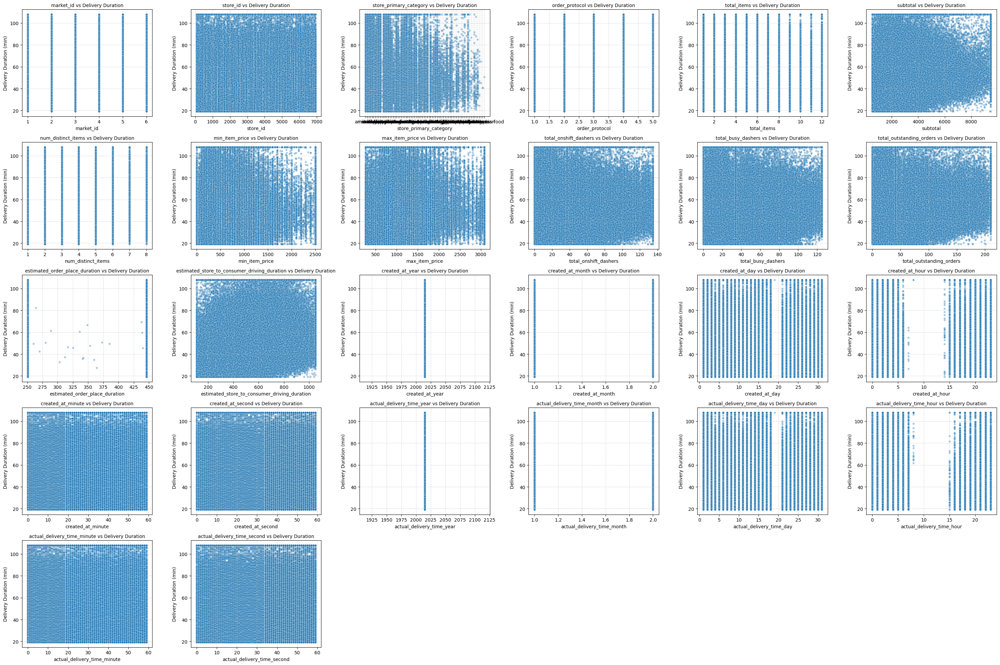

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')

df=pd.read_csv("/content/drive/MyDrive/CSSI Team Project/historical_data.csv")
df.head()
df.shape
df.drop_duplicates(inplace=True)
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace(r'[^\w\s]', '', regex=True)
datetime_cols = [col for col in ['created_at', 'actual_delivery_time'] if col in df.columns]
for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df[col + '_hour'] = df[col].dt.hour
    df[col + '_minute'] = df[col].dt.minute
    df[col + '_second'] = df[col].dt.second

# Calculate delivery duration before dropping the original datetime columns

if set(['created_at', 'actual_delivery_time']).issubset(df.columns):
    df['delivery_duration'] = (df['actual_delivery_time'] - df['created_at']).dt.total_seconds() / 60

for col in datetime_cols:
    df.drop(col, axis=1, inplace=True)

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
for col in numeric_cols:
    df[col] = df[col].fillna(df[col].median())
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])
for col in numeric_cols:
    lower, upper = df[col].quantile(0.01), df[col].quantile(0.99)
    df[col] = df[col].clip(lower=lower, upper=upper)


df.head()
print("Cleaned dataset shape:", df.shape)
print("Null values remaining:\n", df.isnull().sum().sort_values(ascending=False).head())
df.head()

#visualizing each feature against the predictor
features_to_plot = [col for col in df.columns if col != 'delivery_duration']
n_cols = 6
n_rows = (len(features_to_plot) + n_cols - 1) // n_cols
plt.figure(figsize=(5*n_cols, 4*n_rows))

for idx, feature in enumerate(features_to_plot):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.scatterplot(x=df[feature], y=df['delivery_duration'], alpha=0.4, s=20, edgecolor='w')
    plt.title(f"{feature} vs Delivery Duration", fontsize=10)
    plt.xlabel(feature)
    plt.ylabel("Delivery Duration (min)")
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [13]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#SVM - Shriya

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')

df=pd.read_csv("/content/drive/MyDrive/CSSI Team Project/historical_data.csv")
df = df.sample(n=5000, random_state=42).copy() #sample 5000
df.head()
df.shape
df.drop_duplicates(inplace=True)
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace(r'[^\w\s]', '', regex=True)
datetime_cols = [col for col in ['created_at', 'actual_delivery_time'] if col in df.columns]
for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df[col + '_hour'] = df[col].dt.hour
    df[col + '_minute'] = df[col].dt.minute
    df[col + '_second'] = df[col].dt.second


if set(['created_at', 'actual_delivery_time']).issubset(df.columns):
    df['delivery_duration'] = (df['actual_delivery_time'] - df['created_at']).dt.total_seconds() / 60

for col in datetime_cols:
    df.drop(col, axis=1, inplace=True)

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
for col in numeric_cols:
    df[col] = df[col].fillna(df[col].median())
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])
for col in numeric_cols:
    lower, upper = df[col].quantile(0.01), df[col].quantile(0.99)
    df[col] = df[col].clip(lower=lower, upper=upper)


df.head()
print("Cleaned dataset shape:", df.shape)
print("Null values remaining:\n", df.isnull().sum().sort_values(ascending=False).head())
df.head()



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Cleaned dataset shape: (5000, 27)
Null values remaining:
 market_id                 0
store_id                  0
store_primary_category    0
order_protocol            0
total_items               0
dtype: int64


,market_id,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_dashers,...,created_at_hour,created_at_minute,created_at_second,actual_delivery_time_year,actual_delivery_time_month,actual_delivery_time_day,actual_delivery_time_hour,actual_delivery_time_minute,actual_delivery_time_second,delivery_duration
175813,2.0,3955.0,smoothie,2.0,2,1944.00,2,595,1199.0,12.0,...,18,23,56,2015,1,24,19,24,39,60.716667
79762,2.0,5704.0,vietnamese,5.0,2,2098.00,2,836,1138.0,31.0,...,19,2,58,2015,1,22,19,25,44,22.766667
80915,4.0,6323.0,vietnamese,2.0,3,3135.00,3,695,1395.0,35.0,...,20,39,21,2015,2,1,21,19,24,40.050000
155400,2.0,892.0,french,5.0,1,895.00,1,895,895.0,10.0,...,18,8,25,2015,2,16,18,42,6,33.683333
78044,2.0,6884.0,burger,5.0,1,596.98,1,950,950.0,23.0,...,18,55,33,2015,2,15,19,28,10,32.616667


In [15]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


X = df.drop(['delivery_duration'], axis=1)
y = df['delivery_duration']
X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [16]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
regressor = SVR(kernel='rbf')
regressor.fit(X_train_scaled, y_train)
y_pred = regressor.predict(X_test_scaled)

print("Mean Squared Error for rbf:", mean_squared_error(y_test, y_pred))

Mean Squared Error for rbf: 252.55191119739723


Mean Squared Error for rbf: 230.5681711169124
Mean Squared Error for linear: 224.850526426849
Mean Squared Error for poly: 257.6110042885926
Mean Squared Error for sigmoid: 4260.446883691851


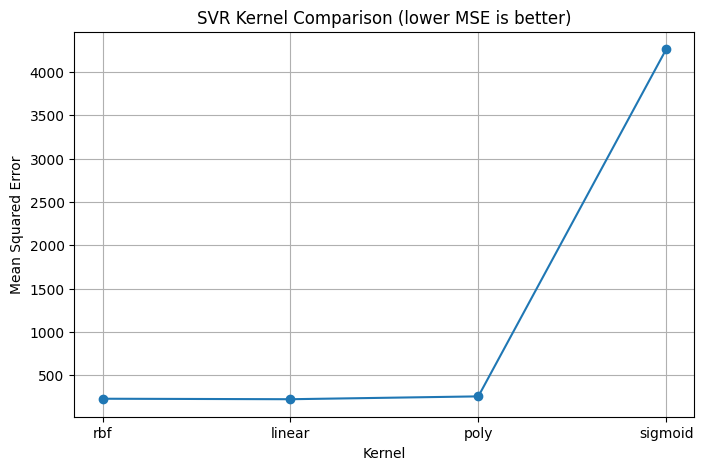

In [17]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Define the list of kernels to compare
kernels = ['rbf', 'linear', 'poly', 'sigmoid']

# To store mean squared error values
mse_scores = []

# Loop through each kernel
for kernel in kernels:

    model = SVR(kernel=kernel, C=100, epsilon=10)


    model.fit(X_train_scaled, y_train)


    y_pred = model.predict(X_test_scaled)


    mse = mean_squared_error(y_test, y_pred)
    mse_scores.append(mse)
    print(f"Mean Squared Error for {kernel}: {mse}")


plt.figure(figsize=(8, 5))
plt.plot(kernels, mse_scores, marker='o')
plt.title("SVR Kernel Comparison (lower MSE is better)")
plt.xlabel("Kernel")
plt.ylabel("Mean Squared Error")
plt.grid(True)
plt.show()

Evaluating kernel: linear
Average MSE for linear: 214.37
Evaluating kernel: rbf
Average MSE for rbf: 224.94
Evaluating kernel: poly
Average MSE for poly: 258.34
Evaluating kernel: sigmoid
Average MSE for sigmoid: 4273.36


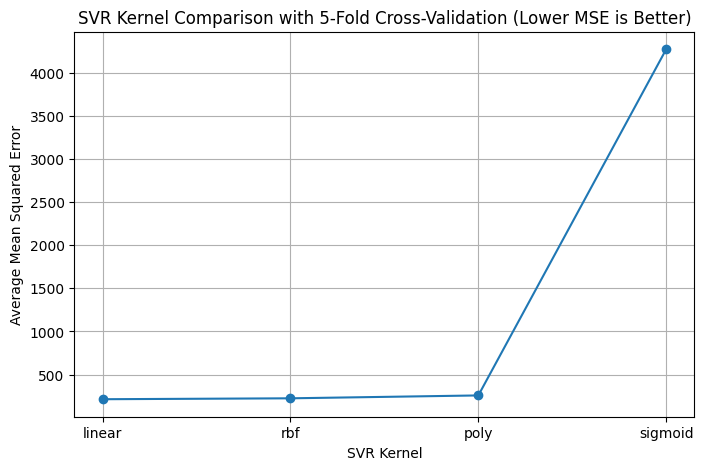

In [18]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline

kernels = ['linear', 'rbf', 'poly', 'sigmoid']
avg_mse_scores = []


kf = KFold(n_splits=5, shuffle=True, random_state=42)
for kernel in kernels:
    print(f"Evaluating kernel: {kernel}")

    # Create pipeline with StandardScaler and SVR
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('svr', SVR(kernel=kernel, C=100, epsilon=10))
    ])
    # Perform cross-validation
    neg_mse = cross_val_score(pipeline, X, y, scoring='neg_mean_squared_error', cv=kf)
    mean_mse = -np.mean(neg_mse)
    avg_mse_scores.append(mean_mse)
    print(f"Average MSE for {kernel}: {mean_mse:.2f}")

# Plotting
plt.figure(figsize=(8, 5))
plt.plot(kernels, avg_mse_scores, marker='o')
plt.title("SVR Kernel Comparison with 5-Fold Cross-Validation (Lower MSE is Better)")
plt.xlabel("SVR Kernel")
plt.ylabel("Average Mean Squared Error")
plt.grid(True)
plt.show()

# KNN - Deeksha

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

df = df.dropna(subset=['delivery_duration'])


Avg Delivery Time by Cluster:
                    mean  count
cluster_label                  
1              45.172159   1736
2              46.051333     25
0              47.909452   3239


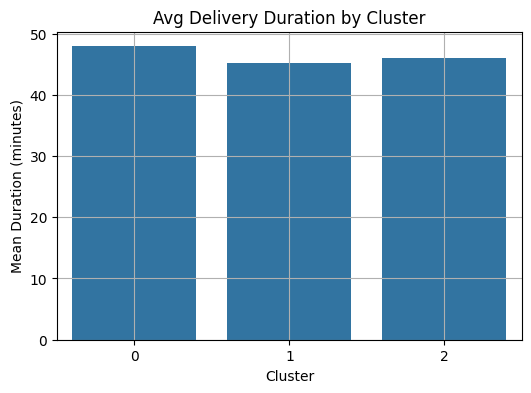

In [20]:

# unupervised learning through clustering

X_clustering = df.drop(columns=['delivery_duration'])
X_clustering = pd.get_dummies(X_clustering, drop_first=True)

scaler_clust = StandardScaler()
X_clust_scaled = scaler_clust.fit_transform(X_clustering)

kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster_label'] = kmeans.fit_predict(X_clust_scaled)

# delivery duration by cluster
cluster_summary = df.groupby('cluster_label')['delivery_duration'].agg(['mean', 'count']).sort_values('mean')
print("Avg Delivery Time by Cluster:")
print(cluster_summary)

#visualizing clustering
plt.figure(figsize=(6,4))
sns.barplot(x=cluster_summary.index, y=cluster_summary['mean'])
plt.title("Avg Delivery Duration by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Mean Duration (minutes)")
plt.grid(True)
plt.show()



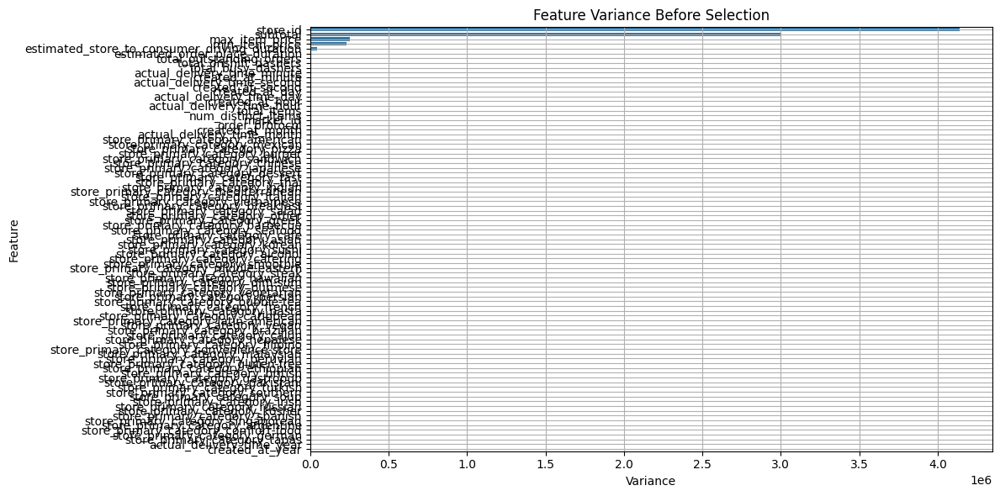

Dropped Features Due to Low Variance:
- created_at_year
- actual_delivery_time_year
- store_primary_category_alcohol
- store_primary_category_argentine
- store_primary_category_brazilian
- store_primary_category_british
- store_primary_category_bubble-tea
- store_primary_category_burmese
- store_primary_category_cajun
- store_primary_category_caribbean
- store_primary_category_catering
- store_primary_category_comfort-food
- store_primary_category_convenience-store
- store_primary_category_dim-sum
- store_primary_category_ethiopian
- store_primary_category_filipino
- store_primary_category_french
- store_primary_category_gastropub
- store_primary_category_german
- store_primary_category_gluten-free
- store_primary_category_hawaiian
- store_primary_category_irish
- store_primary_category_kosher
- store_primary_category_latin-american
- store_primary_category_malaysian
- store_primary_category_middle-eastern
- store_primary_category_nepalese
- store_primary_category_pakistani
- store_pri

In [21]:
# Feature selection

X_raw = df.drop(columns=['delivery_duration', 'cluster_label'])
y = df['delivery_duration']

X_encoded = pd.get_dummies(X_raw, drop_first=True)

# Visualizing variance
feature_variance = X_encoded.var().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_variance.values, y=feature_variance.index)
plt.title("Feature Variance Before Selection")
plt.xlabel("Variance")
plt.ylabel("Feature")
plt.tight_layout()
plt.grid(True)
plt.show()

# Apply Variance Threshold
selector = VarianceThreshold(threshold=0.01)
X_selected = selector.fit_transform(X_encoded)
selected_columns = X_encoded.columns[selector.get_support()]
X = pd.DataFrame(X_selected, columns=selected_columns)

# Dropped Features
dropped = X_encoded.columns[~selector.get_support()]
print("Dropped Features Due to Low Variance:")
for col in dropped:
    print("-", col)



In [22]:
# splitting data
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.10, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1111, random_state=42)

print(f"Train: {X_train.shape} | Val: {X_val.shape} | Test: {X_test.shape}")

#standardizing tainding data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

Train: (4000, 47) | Val: (500, 47) | Test: (500, 47)



 Baseline KNN Validation:
R²: -0.022253076226145918
MAE: 13.119357533333334


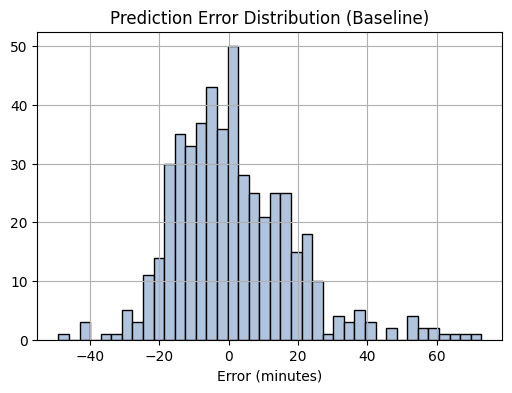

In [23]:
# baseline KNN

baseline_knn = KNeighborsRegressor(n_neighbors=5)
baseline_knn.fit(X_train_scaled, y_train)
y_val_pred = baseline_knn.predict(X_val_scaled)

print("\n Baseline KNN Validation:")
print("R²:", r2_score(y_val, y_val_pred))
print("MAE:", mean_absolute_error(y_val, y_val_pred))

#Error Histogram
plt.figure(figsize=(6,4))
plt.hist(y_val - y_val_pred, bins=40, color='lightsteelblue', edgecolor='black')
plt.title("Prediction Error Distribution (Baseline)")
plt.xlabel("Error (minutes)")
plt.grid(True)
plt.show()


Sampled shape for tuning: (800, 47) (800,)
Validation shape: (500, 47) (500,)

 Tuned Model Validation:
Best Params: {'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}
R²: 0.10160846672812618
MAE: 12.269880074566684
MSE: 271.8227752402255


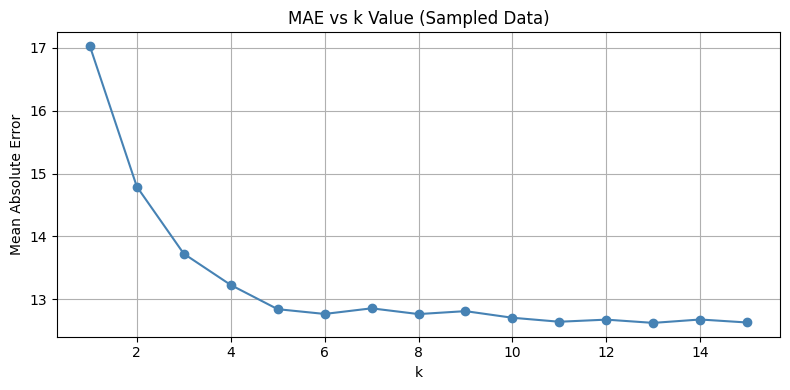

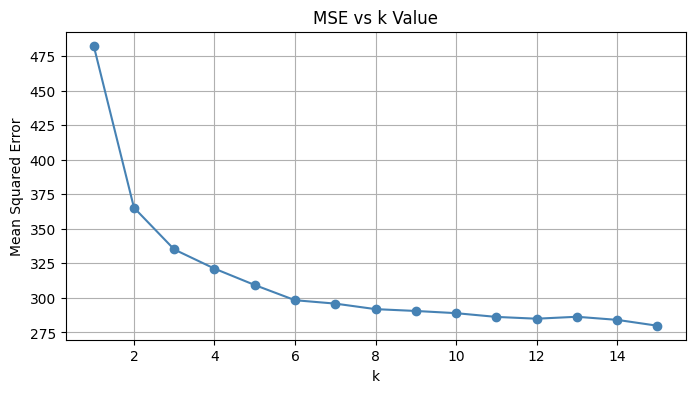

In [24]:
#Sampling 20% of training data
X_train_sample, _, y_train_sample, _ = train_test_split(
    X_train_scaled, y_train, test_size=0.8, random_state=42
)

print("Sampled shape for tuning:", X_train_sample.shape, y_train_sample.shape)
print("Validation shape:", X_val_scaled.shape, y_val.shape)

#Grid search with reduced data
param_grid = {
    'n_neighbors': [23, 25, 27, 30, 35, 51],
    'metric': ['euclidean', 'manhattan'], 'weights': ['uniform', 'distance']
}

grid = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5,
                    scoring='neg_mean_absolute_error', n_jobs=-1)

grid.fit(X_train_sample, y_train_sample)

best_knn = grid.best_estimator_
y_val_best = best_knn.predict(X_val_scaled)

print("\n Tuned Model Validation:")
print("Best Params:", grid.best_params_)
print("R²:", r2_score(y_val, y_val_best))
print("MAE:", mean_absolute_error(y_val, y_val_best))
print("MSE:", mean_squared_error(y_val, y_val_best))

#MAE vs k using same validation set
mae_list = []
k_range = range(1, 16)
for k in k_range:
    knn = KNeighborsRegressor(n_neighbors=k)
    knn.fit(X_train_sample, y_train_sample)
    preds = knn.predict(X_val_scaled)
    mae_list.append(mean_absolute_error(y_val, preds))

plt.figure(figsize=(8,4))
plt.plot(k_range, mae_list, marker='o', color='steelblue')
plt.title("MAE vs k Value (Sampled Data)")
plt.xlabel("k")
plt.ylabel("Mean Absolute Error")
plt.grid(True)
plt.tight_layout()
plt.show()

#MSE vs k
mse_list= []
for k in k_range:
    knn = KNeighborsRegressor(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)
    preds = knn.predict(X_val_scaled)
    mse_list.append(mean_squared_error(y_val, preds))
plt.figure(figsize=(8,4))
plt.plot(k_range, mse_list, marker='o', color='steelblue')
plt.title("MSE vs k Value")
plt.xlabel("k")
plt.ylabel("Mean Squared Error")
plt.grid(True)



In [25]:
# final evaluation
y_test_pred = best_knn.predict(X_test_scaled)

print("\nFinal Test Evaluation (Full Test Set):")
print("R²:", r2_score(y_test, y_test_pred))
print("MAE:", mean_absolute_error(y_test, y_test_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred)))
print("MSE:", mean_squared_error(y_test, y_test_pred))


Final Test Evaluation (Full Test Set):
R²: 0.11519916826378218
MAE: 12.251379083734536
RMSE: 16.515169670914766
MSE: 272.75082925910294


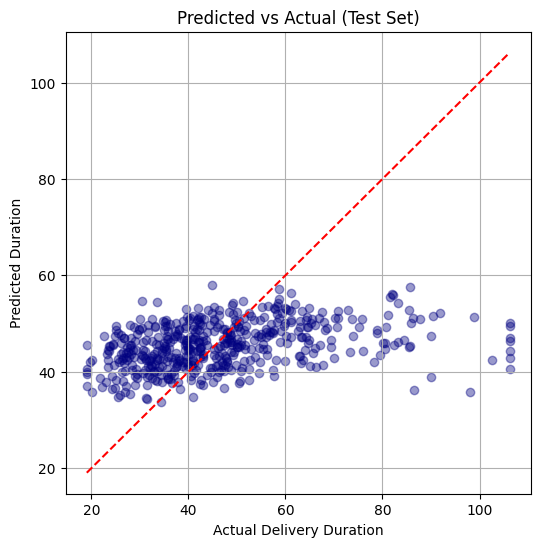

In [26]:
#Prediction vs Actual Scatter
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_test_pred, alpha=0.4, color='navy')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Delivery Duration")
plt.ylabel("Predicted Duration")
plt.title("Predicted vs Actual (Test Set)")
plt.grid(True)
plt.show()


# Decision Tree/Random Forest - Dia


**Initializing**

In [27]:
# Importing all the needed libraries
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import recall_score
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import display
import matplotlib.pyplot as plt


In [28]:
# Adding one-hot encoding on specific columns
df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

In [29]:
# Separating the Feature and Target Variables
target_col = 'delivery_duration'

x = df_encoded.drop(target_col, axis=1)
y = df_encoded[target_col]

non_num_cols = x.select_dtypes(exclude=[np.number]).columns.tolist()
num_cols = x.select_dtypes(include=[np.number]).columns.tolist()

In [30]:
# Splitting the data into Training and Test Sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
print("Training set shape:", x_train.shape, y_train.shape)
print("Testing set shape:", x_test.shape, y_test.shape)

Training set shape: (4000, 90) (4000,)
Testing set shape: (1000, 90) (1000,)


**Decision Tree**

Best max_depth (lowest MSE): 11
Validation MSE: 157.8560
Validation R² score: 0.4650


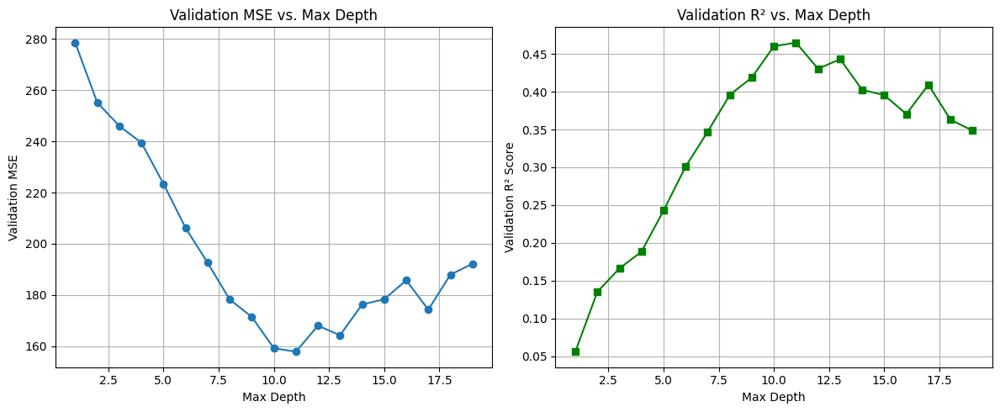

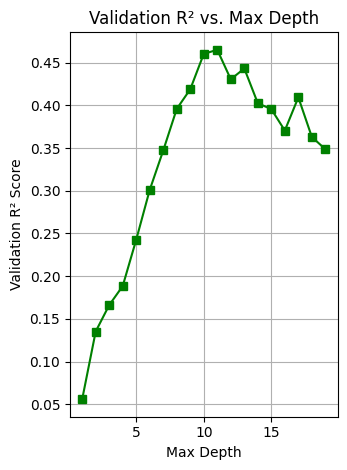

In [31]:
# Splitting data into training and validation sets
x_train_split, x_val, y_train_split, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

# Setting the range for depths and creating lists for R^2 and MSE values
depths = range(1, 20)
val_errors = []
r2_scores = []

# Looping all the possible max_depth values
for d in depths:
    dt = DecisionTreeRegressor(max_depth=d, random_state=42)
    dt.fit(x_train_split, y_train_split)
    y_pred = dt.predict(x_val)

    mse = mean_squared_error(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)

    val_errors.append(mse)
    r2_scores.append(r2)

# Finding best depth based on MSE
best_depth = depths[val_errors.index(min(val_errors))]
print(f"Best max_depth (lowest MSE): {best_depth}")
print(f"Validation MSE: {min(val_errors):.4f}")
print(f"Validation R² score: {r2_scores[val_errors.index(min(val_errors))]:.4f}")

# Training the decision tree to use the best_depth value
dt_regressor = DecisionTreeRegressor(max_depth=best_depth, random_state=42)
dt_regressor.fit(x_train, y_train)

# Plot both MSE and R^2
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(depths, val_errors, marker='o')
plt.xlabel("Max Depth")
plt.ylabel("Validation MSE")
plt.title("Validation MSE vs. Max Depth")
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(depths, r2_scores, marker='s', color='green')
plt.xlabel("Max Depth")
plt.ylabel("Validation R² Score")
plt.title("Validation R² vs. Max Depth")
plt.grid(True)

plt.tight_layout()
plt.show()



plt.subplot(1,2,2)
plt.plot(depths, r2_scores, marker='s', color='green')
plt.xlabel("Max Depth")
plt.ylabel("Validation R² Score")
plt.title("Validation R² vs. Max Depth")
plt.grid(True)

plt.tight_layout()
plt.show()


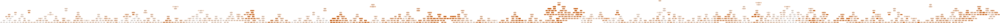

In [32]:
# Plotting the decision tree
dot_data = export_graphviz(dt_regressor,
                               out_file=None,
                               feature_names=x_train.columns,
                               filled=True,
                               rounded=True,
                               special_characters=True,
                               max_depth=best_depth,
                               precision=2,
                               node_ids=True,
                               proportion=False
                              )

graph = graphviz.Source(dot_data)
display(graph)

**Random Forest**


Best max_depth (lowest MSE): 14
Corresponding Validation MSE: 128.6635
Corresponding Validation R² score: 0.5639


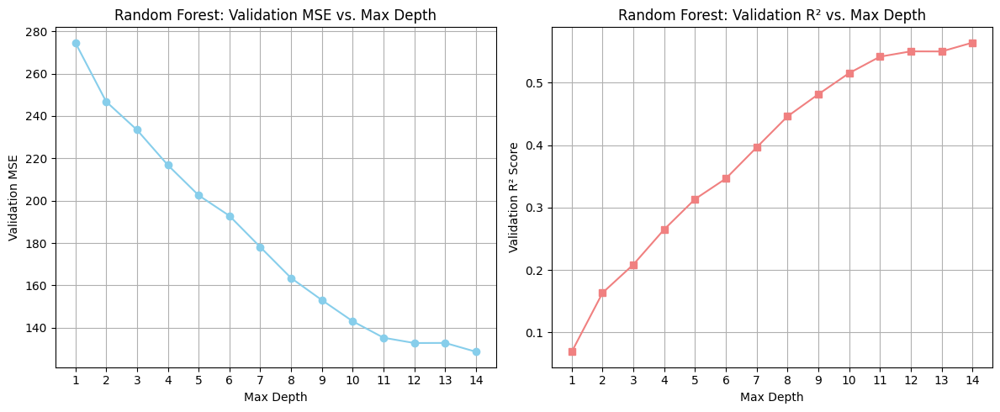

In [33]:
# Splitting data into training and validation sets
x_train_split, x_val, y_train_split, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

# Setting the range for depths and creating lists for R^2 and MSE values
depths = range(1, 15)
val_errors_mse = []
r2_scores = []

# Defining the number of estimators for the random forest
n_estimators_rf = 20

# Looping all the possible max_depth values
for d in depths:

    rf = RandomForestRegressor(max_depth=d, n_estimators=n_estimators_rf, random_state=42)
    rf.fit(x_train_split, y_train_split)
    y_pred = rf.predict(x_val)

    mse = mean_squared_error(y_val, y_pred)
    val_errors_mse.append(mse)

    r2 = r2_score(y_val, y_pred)
    r2_scores.append(r2)

# Finding best depth based on MSE
best_depth_mse = depths[val_errors_mse.index(min(val_errors_mse))]
best_mse_value = min(val_errors_mse)
best_r2_at_mse_depth = r2_scores[val_errors_mse.index(min(val_errors_mse))]
print(f"\nBest max_depth (lowest MSE): {best_depth_mse}")
print(f"Corresponding Validation MSE: {best_mse_value:.4f}")
print(f"Corresponding Validation R² score: {best_r2_at_mse_depth:.4f}")

# Training the random forest to use the best_depth value
rf_regressor_final = RandomForestRegressor(max_depth=best_depth_mse, n_estimators=n_estimators_rf, random_state=42)
rf_regressor_final.fit(x_train, y_train)

# Plot both MSE and R^2
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(depths, val_errors_mse, marker='o', color='skyblue')
plt.xlabel("Max Depth")
plt.ylabel("Validation MSE")
plt.title("Random Forest: Validation MSE vs. Max Depth")
plt.grid(True)
plt.xticks(depths)

plt.subplot(1, 2, 2)
plt.plot(depths, r2_scores, marker='s', color='lightcoral')
plt.xlabel("Max Depth")
plt.ylabel("Validation R² Score")
plt.title("Random Forest: Validation R² vs. Max Depth")
plt.grid(True)
plt.xticks(depths)

plt.tight_layout()
plt.show()

In [34]:
# Plotting one decision tree from the random forest
tree_from_rf = rf_regressor_final.estimators_[0]
dot_data_rf_single_tree = export_graphviz(tree_from_rf,
                           out_file=None,
                           feature_names=x_train.columns,
                           filled=True,
                           rounded=True,
                           special_characters=True,
                           max_depth=best_depth_mse,
                           precision=2,
                           node_ids=True,
                           proportion=False
                          )
graph_rf_single_tree = graphviz.Source(dot_data_rf_single_tree)
display(graph_rf_single_tree)

# Linear Regression - Sarah

In [35]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

df['total_available_dashers'] = df['total_onshift_dashers'] - df['total_busy_dashers']

x = df[['subtotal', 'total_items', 'min_item_price', 'max_item_price', 'total_available_dashers', 'total_outstanding_orders', 'estimated_order_place_duration', 'estimated_store_to_consumer_driving_duration']]
y = df['delivery_duration']

q_hi = df['delivery_duration'].quantile(0.99)
df = df[df['delivery_duration'] < q_hi]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
mod = LinearRegression()
mod.fit(x_train, y_train)
y_pred = mod.predict(x_test)

In [36]:
from sklearn.linear_model import ElasticNet

mod = ElasticNet(alpha=0.01, l1_ratio=0.1)  # l1_ratio = 0.5 means equal mix
mod.fit(x_train, y_train)

ElasticNet(alpha=0.01, l1_ratio=0.1)

In [37]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error

mse_scores = -cross_val_score(mod, x, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)

r2_scores = cross_val_score(mod, x, y, cv=5, scoring='r2')

print(f"MSE scores (each fold): {mse_scores}")
print(f"RMSE scores (each fold): {rmse_scores}")
print(f"Average RMSE: {rmse_scores.mean():.2f}")
print(f"R² scores (each fold): {r2_scores}")
print(f"Average R²: {r2_scores.mean():.3f}")


MSE scores (each fold): [233.89892819 266.57615155 233.32789318 226.80149958 251.74243795]
RMSE scores (each fold): [15.29375455 16.32715994 15.27507424 15.05993026 15.86639335]
Average RMSE: 15.56
R² scores (each fold): [0.10311577 0.15870991 0.16668501 0.17034979 0.13413287]
Average R²: 0.147


In [38]:
from sklearn.metrics import mean_squared_error, r2_score

#evaluate
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"RMSE: {rmse:.2f}")
print(f"R² Score: {r2:.3f}")

#custom accuracy within 5 mins
tolerance = 5
accurate_preds = np.abs(y_test - y_pred) <= tolerance
accuracy = np.mean(accurate_preds)
print(f"Custom Accuracy within {tolerance} minutes: {accuracy * 100:.2f}%")
#accuracy within 10 mins
tolerance = 10
accurate_preds = np.abs(y_test - y_pred) <= tolerance
accuracy = np.mean(accurate_preds)
print(f"Custom Accuracy within {tolerance} minutes: {accuracy * 100:.2f}%")

Mean Squared Error: 241.4348576912985
RMSE: 15.54
R² Score: 0.177
Custom Accuracy within 5 minutes: 24.00%
Custom Accuracy within 10 minutes: 50.40%


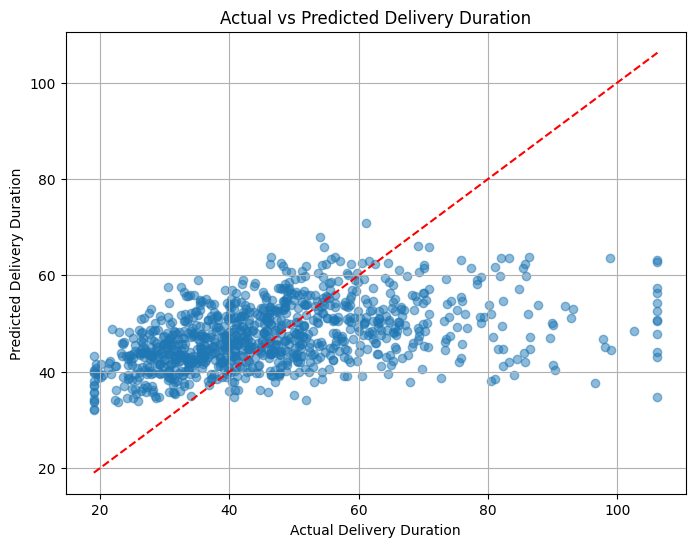

In [39]:
#create plot

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel("Actual Delivery Duration")
plt.ylabel("Predicted Delivery Duration")
plt.title("Actual vs Predicted Delivery Duration")
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')  # Perfect prediction line
plt.grid(True)
plt.show()

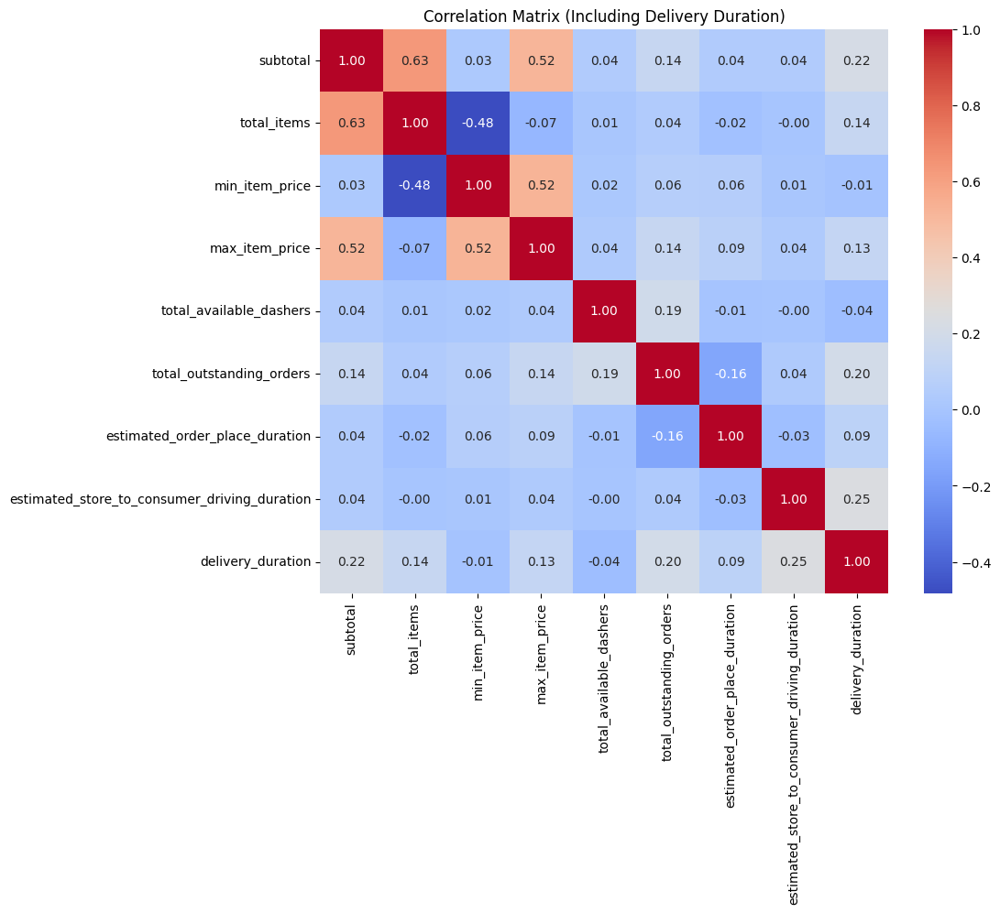

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

#correlation matrix
df_corr = x.copy()
df_corr['delivery_duration'] = y
plt.figure(figsize=(10, 8))
sns.heatmap(df_corr.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix (Including Delivery Duration)")
plt.show()